# This notebook shows how to perform mutations on generated sequences and visualize mutational steps.

#### It uses the synthetic sequences file generated via MM_using_DeepMELs notebook.
#### It consists of:
* Printing DNA sequences in nucleotide letters for different mutational steps.
* Applying mutations to selected position and substation.
* Plotting the findings.
	

#### Luciferase values are in ./data/luciferase folder
#### Figures are saved to ./figures/mutational_steps and ./figures/repressor_addition folders

### General imports

In [1]:
import sys  
import os
import pickle
import utils
import numpy as np
import scipy
import tensorflow as tf
tf.disable_eager_execution()
tf.logging.set_verbosity(tf.logging.ERROR)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use("default")
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

### Loading DeepMEL2 data to be used for the initialization of shap.DeepExplainer


In [2]:
print('Loading data...')
f = open('./data/deepmel2/DeepMEL2_nonAugmented_data.pkl', "rb")
nonAugmented_data_dict = pickle.load(f)
f.close()

Loading data...


### Loading the models and initializing shap.DeepExplainer


In [3]:
print('Loading model...')
import shap
tf.disable_eager_execution()
rn=np.random.choice(nonAugmented_data_dict["train_data"].shape[0], 250, replace=False)
model_dict = {}
exp_dict = {} 

name = "deepmel2"
model_json_file = "models/deepmel2/model.json"
model_hdf5_file = "models/deepmel2/model_epoch_07.hdf5"
model_dict[name] = utils.load_model(model_json_file, model_hdf5_file)
exp_dict[name] = shap.DeepExplainer((model_dict[name].inputs, model_dict[name].layers[-1].output), [nonAugmented_data_dict["train_data"][rn],nonAugmented_data_dict["train_data"][rn][:,::-1,::-1]])


name = "deepmel2_gabpa"
model_json_file = "models/deepmel2_gabpa/model.json"
model_hdf5_file = "models/deepmel2_gabpa/model_epoch_09.hdf5"
model_dict[name] = utils.load_model(model_json_file, model_hdf5_file)
exp_dict[name] = shap.DeepExplainer((model_dict[name].inputs, model_dict[name].layers[-1].output), [nonAugmented_data_dict["train_data"][rn],nonAugmented_data_dict["train_data"][rn][:,::-1,::-1]])


name = "deepmel"
model_json_file = "models/deepmel/model.json"
model_hdf5_file = "models/deepmel/model_best_loss.hdf5"
model_dict[name] = utils.load_model(model_json_file, model_hdf5_file)
exp_dict[name] = shap.DeepExplainer((model_dict[name].inputs, model_dict[name].layers[-1].output), [nonAugmented_data_dict["train_data"][rn],nonAugmented_data_dict["train_data"][rn][:,::-1,::-1]])


Loading model...


In [4]:
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

### Loading the generated sequences via in silico evolution

In [5]:
import pickle
f = open("data/deepmel2/MM_EFS_4000_withmut.pkl", "rb")
random_seq_4000_dict = pickle.load(f)
f.close()

### Printing generated DNA sequence (EFS-4) at different mutational steps 

In [6]:
#[15,17,19,22,27,45,49,60,68,72]
id_ = 22

for n_mut in [0,3,4,7,8,12]:
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        
    print(f'>MM-EFS-4_mut{n_mut}')
    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")

>MM-EFS-4_mut0
TGATATGTATTCACCCATGCCCTCACGTTCCTAAGTGGTGGGGTAGAGGGTCGCTGCCATATTACGTTGGGCAGAAGACTACGTCCAGAATGCTCATGAATAAGACTATGCAATGGTAGGACGCATCCATAGTCATTCGCACAGGGACGACAGGATCATTGTGCGGGTATACAACCACATAATCTTGTTTATCCACGTCAACACAAACACATTTGGGCCTGGACCAGTCGGTGTCAAGTGCAGGAGGGTATACCAAGGTTCAGATCTTGAACAGGTGGTAACAGAATTTAGTTAAGTAGGGATTCTCCGTGACAACGCCCCGATTGCTGTTACTACGCAATCGATATTATGTAGCCTTACAGCAACCAGTAAGATTAATCCACTATCATAGTCTTAGCCCTCGATCAAGACTCTCGACTCCCGATCCAGCTATTGAATTAGCAATTAGCTGTCTATTGCTCGGACTATTTCGTATAAAGGAGCATACATATACAAACCCT
>MM-EFS-4_mut3
TGATATGTATTCACCCATGCCCTCACGTTCCTAAGTGGTGGGGTAGAGGGTCGCTGCCATATTACGTTGGGCAGAAGACTACGTCCAGAATGCTCATGAATAAGACTATGCAATGGTAGGACGCATCCATAGTCATTCGCACAGGAACAAAAGGATCATTGTGCGGGTATACAACCACATAATCTTGTTTATCCACGTCAACACAAACACATTTGGGCCTGGACCAGTCGGTGTCAAGTGCAGGAGGGTATACCAAGGTTCAGATCTTGAACAGGTGGTAACAGAATTTAGTTAAGTAGGGATTCTCCGTGACAACGCCCCGATTGCTGTTACTACGCAATCGATATTATGTAGCCTTACAGCAACCAGTAAGATTAATCCACTATCATAGTCTTAGCCCTCGATCAAGACTCTCGACTCCCGATCCAGCTATTGAATTAGCAATTAGCTGTCTATTGCTCGGACTATT

### Performing mutations and printing repressed EFS-4

In [7]:
id_ = 22
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-4_repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")

>MM-EFS-4_repr
TGATATGTATTCACCCATGCCCTCACGTTCCTAAGTGGTGGGGTAGAGGGTCGCTGCCATATTACGTTGGGCAGAAGACTACGTCCAGAATGCTCATGAATGAGACTATTCAAAGGTAGGACGCATCCATAGTCATTCGCACAGGAACAAAGGGATCATTGTGCAGGTATACAACAACAGAACCTTGTTTATCCACGTCAACACAAACACCTTTGCACCTGGACCAGTCGGTGTCAAGTGCCGGAGGGTATACCAAGGTGCAGATCTTGAACACGTGGTAACAGAATTTAGGTAAGTAGGTATTCTCCGTAACAATGCCCCCATTGTTGTTACTACGCAATCGATATTATGTAGCCTTACAGCAACCAGTAAGATTAATCCACTATCATAGTCTTAGCCCTCGATCAAGACTCTCGACTCCCGATCCAGCTATTGAATTAGCAATTAGCTGTCTATTGCTCGGACTATTTCGTATAAAGGAGCATACATATACAAACCCT


### Plotting nucleotide contribution scores at different mutational steps

0,1,2,3,4,5,6,7,

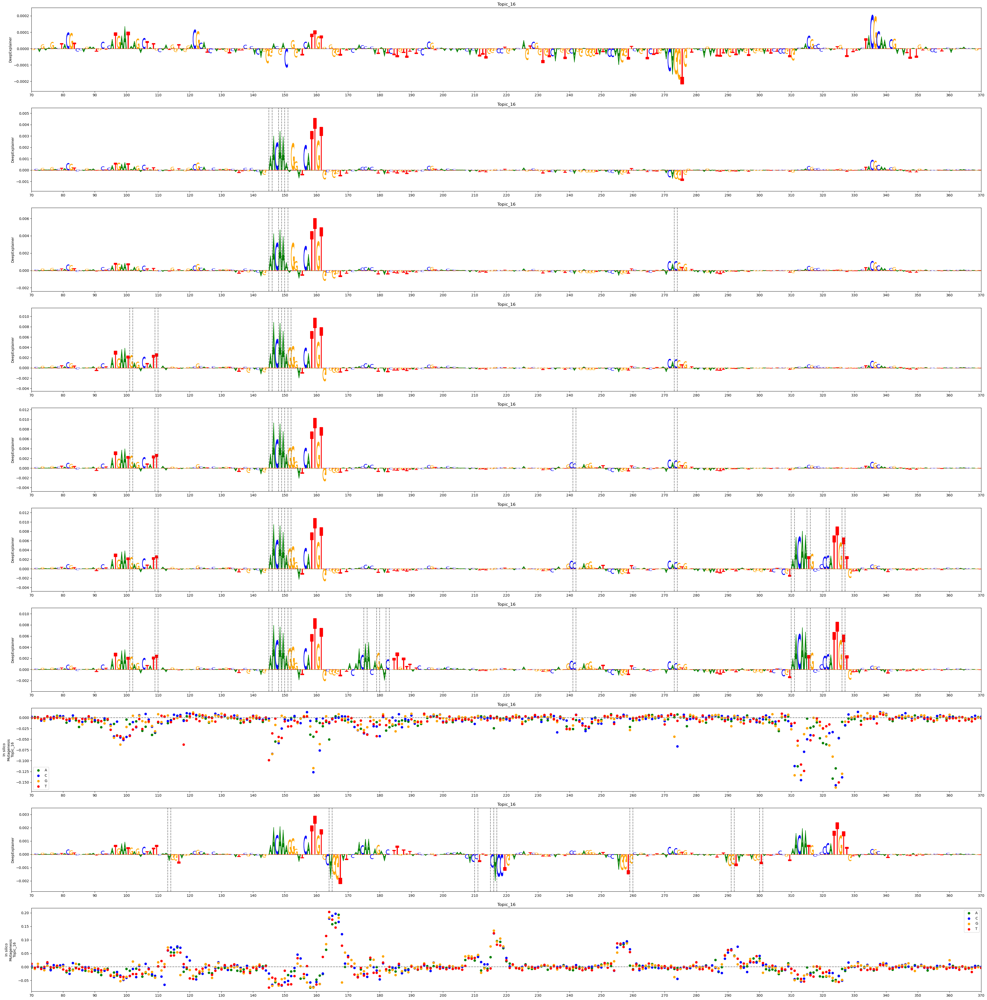

In [8]:
#[15,17,19,22,27,45,49,60,68,72]
id_ = 22
ntrack = 10
fig = plt.figure(figsize=(48,ntrack*5))

st=70
end=370

for trck_, n_mut in enumerate([0,3,4,7,8,12,15]):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
    ax1.set_xlim([st,end])

ax_ = utils.plot_mutagenesis_givenax_fast_withrc(model=model_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=8, seq_onehot=start_x, class_no = 16)
ax_.set_xlim([st,end])

muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
for i, mut_ in enumerate(muts):
    print(i,end=",")
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')


ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=9, seq_onehot=start_x, class_no = 16)
ax2 = utils.plot_mutagenesis_givenax_fast_withrc(model=model_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=10, seq_onehot=start_x, class_no = 16)

muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
for i, mut_ in enumerate(muts):
    ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
    ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
ax1.set_xlim([st,end])
ax2.set_xlim([st,end])

plt.savefig("figures/mutational_steps/MM_steps_EFS-4.pdf",transparent=True)

### Plotting prediction scores at different mutational steps

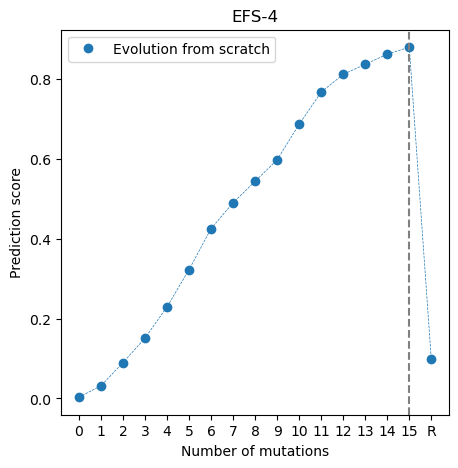

In [9]:
id_ = 22

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15]

plt.figure(figsize=(5,5))
plt.title("EFS-4")
for k,i in enumerate([22]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+[repr_pred],label="Evolution from scratch",linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,i in enumerate([22]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+[repr_pred],label="Evolution from scratch",linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")

plt.savefig("figures/mutational_steps/MM_steps_EFS-4_prediction.pdf",transparent=True,dpi=300)

### Plotting luciferase results at different mutational steps

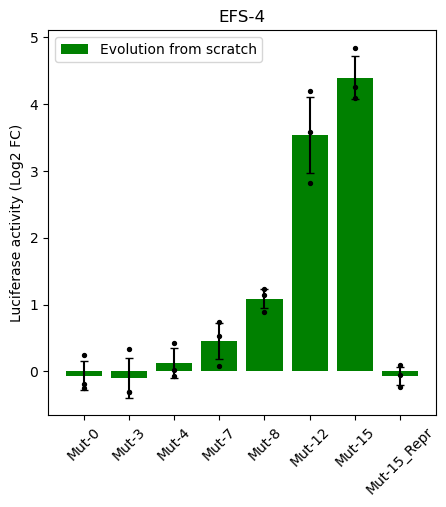

In [10]:
luciferase_dict = {"ids":[],"values":[]}
with open("data/luciferase/EFS4_steps.txt","r") as fr:
    for line in fr:
        if line.startswith("id"):
            continue
        sep = line.strip().split("\t")
        luciferase_dict["ids"].append(sep[0])
        luciferase_dict["values"].append(sep[1:])
luciferase_dict["values"] = np.array(luciferase_dict["values"],dtype="float")

plt.figure(figsize=(5,5))
plt.title("EFS-4")
mean = np.mean(np.log2(luciferase_dict["values"]),axis=1)
std = np.std(np.log2(luciferase_dict["values"]),axis=1)

index = np.argsort(mean)[::-1]
temp = sorted(mean)[::-1]
res = [temp.index(i) for i in mean]

plt.bar(range(len(mean)),mean,color="green",label="Evolution from scratch",yerr=std,capsize=3)
plt.legend()

for i in (range(len(mean))):
    for k in np.log2(luciferase_dict["values"][i]):
        plt.scatter(i,k,color="black",zorder=10,s=8)
    
_ = plt.xticks(range(len(mean)),np.array(luciferase_dict["ids"]),rotation=45)
plt.ylabel("Luciferase activity (Log2 FC)")

plt.savefig("figures/mutational_steps/MM_steps_EFS-4_luciferase.pdf",transparent=True,dpi=300)


### Plotting correlation between prediction scores and luciferase results at different mutational steps

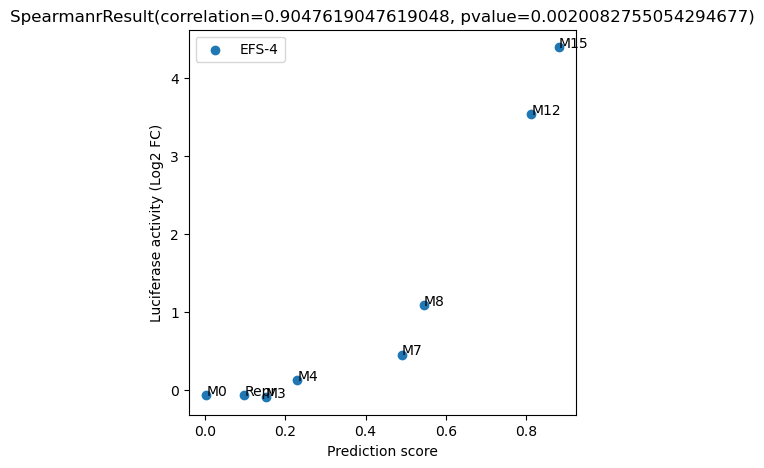

In [11]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot()
plt.title("EFS-4")
mean_luciferase_scores = mean
prediction_scores = list(random_seq_4000_dict["mut_pred"][22,[0,3,4,7,8,12,15],15].T)+[repr_pred]
annotation = ["M0","M3","M4","M7","M8","M12","M15","Repr"]
plt.scatter(prediction_scores,mean_luciferase_scores,label="EFS-4")
for i, txt in enumerate(annotation):
    ax.annotate(txt, (prediction_scores[i], mean_luciferase_scores[i]))
plt.ylabel("Luciferase activity (Log2 FC)")
plt.xlabel("Prediction score")
plt.legend()

ax.set_title(scipy.stats.spearmanr(np.array(prediction_scores),np.array(mean_luciferase_scores),axis=None))

plt.savefig("figures/mutational_steps/MM_steps_EFS-4_correlation.pdf",transparent=True,dpi=300)

### Plotting nucleotide contribution scores for different ZEB2 creating mutations.

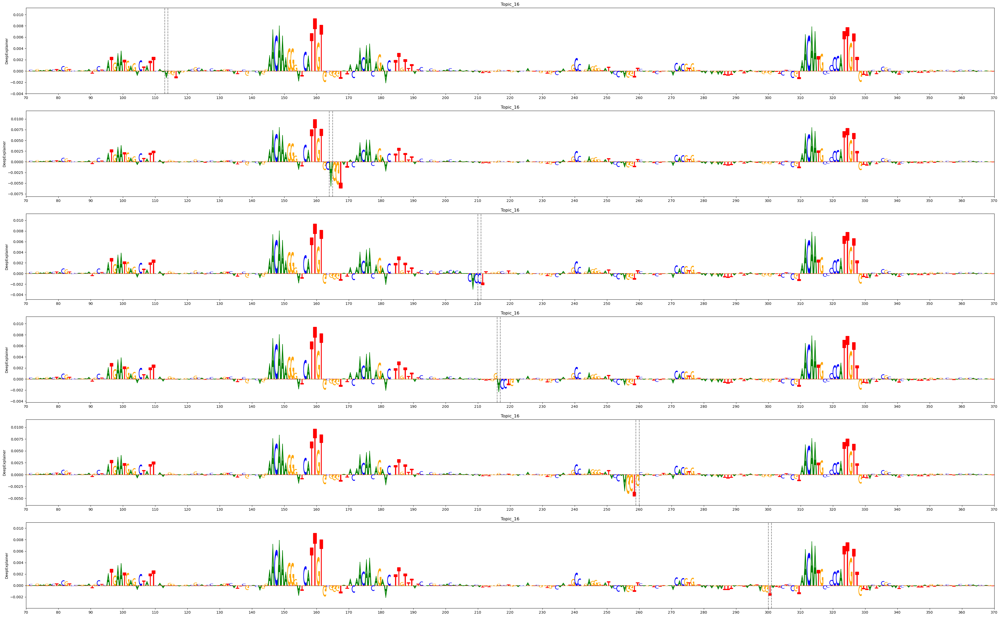

In [14]:
id_ = 22
ntrack = 6
fig = plt.figure(figsize=(48,ntrack*5))

st=70
end=370

muts = ["113_A","164_A","210_C","216_A","259_G","300_T"]
for trck_, mut_ in enumerate(muts):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_ori_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_ori_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_ori_.split("_")[1]], dtype='int8')

    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    
    ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
    ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
    ax1.set_xlim([st,end])
    
plt.savefig("figures/repressor_addition/MM_singleMut_repressor_EFS-4.pdf",transparent=True)

### Plotting nucleotide contribution scores for combination of different ZEB2 creating mutations.

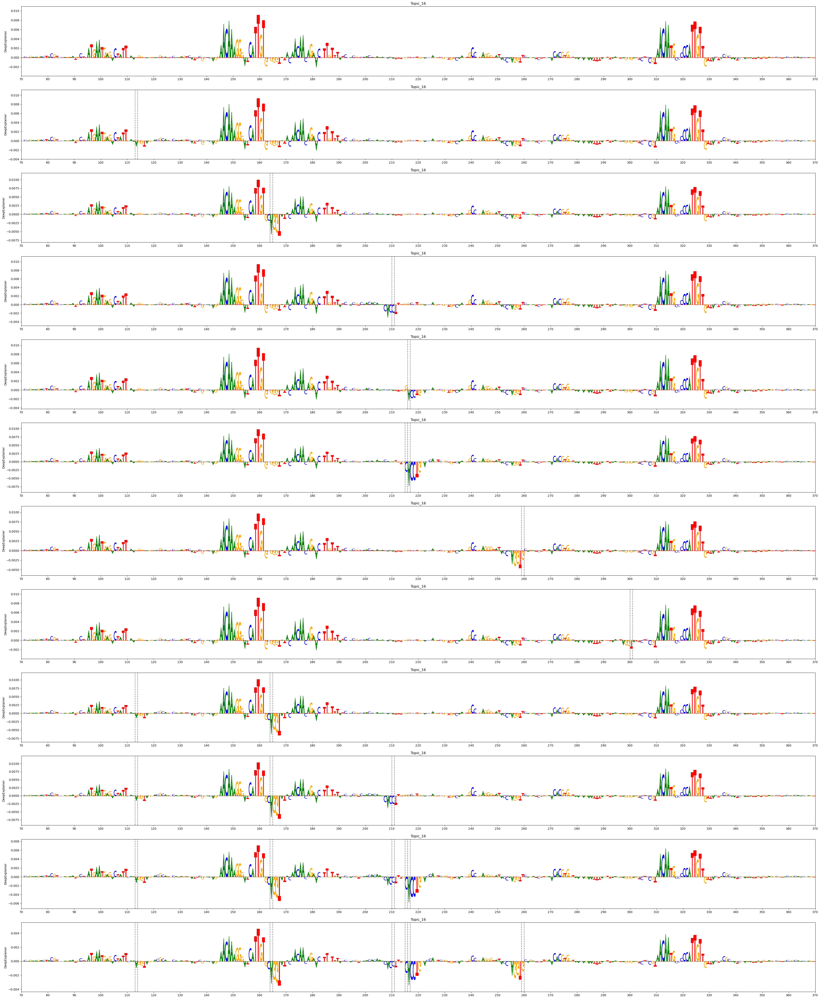

In [18]:
id_ = 22
ntrack = 12
fig = plt.figure(figsize=(48,ntrack*5))

st=70
end=370

muts_all = [[],["113_A"],["164_A"],["210_C"],["216_A"],["215_C","216_A"],["259_G"],["300_T"],
            ["113_A","164_A"],
            ["113_A","164_A","210_C"],
            ["113_A","164_A","210_C","215_C","216_A"],
            ["113_A","164_A","210_C","215_C","216_A","259_G"]]

for trck_, muts in enumerate(muts_all):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_ori_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_ori_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_ori_.split("_")[1]], dtype='int8')
    
    for mut_ in muts:
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    ax1.set_xlim([st,end])
    
    for mut_ in muts:
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        
plt.savefig("figures/repressor_addition/MM_singleMut_wt_steps_repressor_EFS-4.pdf",transparent=True)

### Printing DNA sequences

In [16]:
id_ = 22

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["113_A","164_A","210_C","216_A","259_G","300_T"]
for i, mut_ in enumerate(muts):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    

    print(f'>MM-EFS-4_1repr_{mut_}')
    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")
    

start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["215_C","216_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-4_1repr_215_C_216_A')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")


start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["113_A","164_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-4_2repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")

muts = ["113_A","164_A","210_C"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-4_3repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")

muts = ["113_A","164_A","210_C","215_C","216_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-4_4repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")

muts = ["113_A","164_A","210_C","215_C","216_A","259_G"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-4_5repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")


>MM-EFS-4_1repr_113_A
TGATATGTATTCACCCATGCCCTCACGTTCCTAAGTGGTGGGGTAGAGGGTCGCTGCCATATTACGTTGGGCAGAAGACTACGTCCAGAATGCTCATGAATGAGACTATTCAAAGGTAGGACGCATCCATAGTCATTCGCACAGGAACAAAGGGATCATTGTGCGGGTATACAACAACAGAACCTTGTTTATCCACGTCAACACAAACACATTTGGGCCTGGACCAGTCGGTGTCAAGTGCCGGAGGGTATACCAAGGTTCAGATCTTGAACACGTGGTAACAGAATTTAGTTAAGTAGGGATTCTCCGTAACAATGCCCCCATTGTTGTTACTACGCAATCGATATTATGTAGCCTTACAGCAACCAGTAAGATTAATCCACTATCATAGTCTTAGCCCTCGATCAAGACTCTCGACTCCCGATCCAGCTATTGAATTAGCAATTAGCTGTCTATTGCTCGGACTATTTCGTATAAAGGAGCATACATATACAAACCCT
>MM-EFS-4_1repr_164_A
TGATATGTATTCACCCATGCCCTCACGTTCCTAAGTGGTGGGGTAGAGGGTCGCTGCCATATTACGTTGGGCAGAAGACTACGTCCAGAATGCTCATGAATGAGACTATTCAATGGTAGGACGCATCCATAGTCATTCGCACAGGAACAAAGGGATCATTGTGCAGGTATACAACAACAGAACCTTGTTTATCCACGTCAACACAAACACATTTGGGCCTGGACCAGTCGGTGTCAAGTGCCGGAGGGTATACCAAGGTTCAGATCTTGAACACGTGGTAACAGAATTTAGTTAAGTAGGGATTCTCCGTAACAATGCCCCCATTGTTGTTACTACGCAATCGATATTATGTAGCCTTACAGCAACCAGTAAGATTAATCCACTATCATAGTCTTAGCCCTCGATCAAGACTCTCGACTCCCGATCCAGCTATTGAATTAGCAATTAGCTGTCTA

### Loading and plotting luciferase results

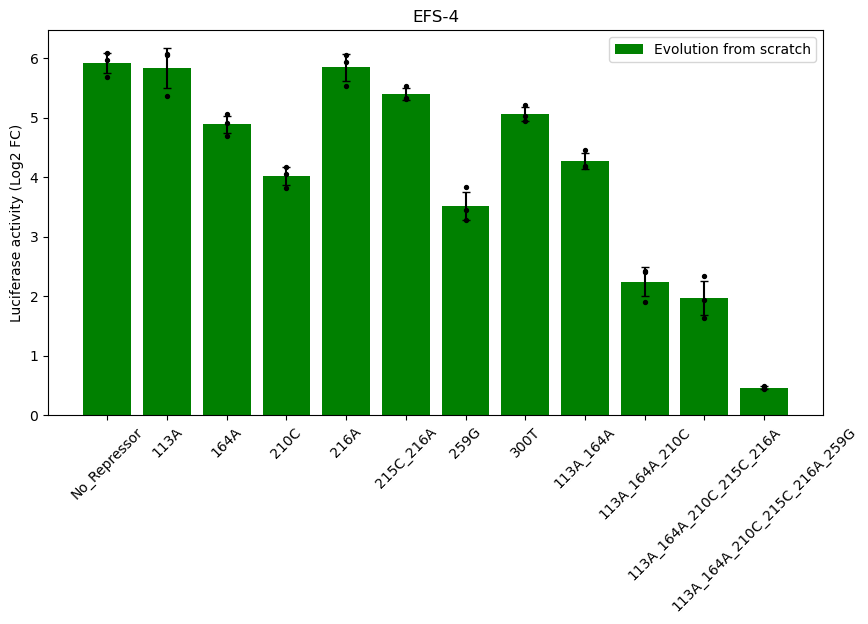

In [ ]:
luciferase_dict = {"ids":[],"values":[]}
with open("data/luciferase/EFS4_repressors.txt","r") as fr:
    for line in fr:
        if line.startswith("id"):
            continue
        sep = line.strip().split("\t")
        luciferase_dict["ids"].append(sep[0])
        luciferase_dict["values"].append(sep[1:])
luciferase_dict["values"] = np.array(luciferase_dict["values"],dtype="float")

plt.figure(figsize=(10,5))
plt.title("EFS-4")
mean = np.mean(np.log2(luciferase_dict["values"]),axis=1)
std = np.std(np.log2(luciferase_dict["values"]),axis=1)

index = np.argsort(mean)[::-1]
temp = sorted(mean)[::-1]
res = [temp.index(i) for i in mean]

plt.bar(range(len(mean)),mean,color="green",label="Evolution from scratch",yerr=std,capsize=3)
plt.legend()

for i in (range(len(mean))):
    for k in np.log2(luciferase_dict["values"][i]):
        plt.scatter(i,k,color="black",zorder=10,s=8)
    
_ = plt.xticks(range(len(mean)),np.array(luciferase_dict["ids"]),rotation=45)
plt.ylabel("Luciferase activity (Log2 FC)")

plt.savefig("figures/repressor_addition/MM_EFS-4_repressors_luciferase.pdf",transparent=True,dpi=300)


### Plotting prediction scores at different mutational steps and after different number of repressor addition

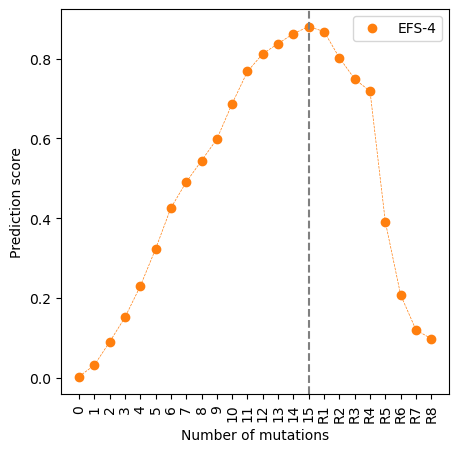

In [15]:
plt.figure(figsize=(5,5))

id_ = 22
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = []
muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    repr_pred.append(model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15])

for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,label="EFS-4",linestyle="",marker="o",color="C1")
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,linestyle="--",linewidth=0.5,color="C1")

_ = plt.xticks(range(24),list(range(16))+["R1","R2","R3","R4","R5","R6","R7","R8"],rotation=90)
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.savefig("figures/repressor_addition/MM_RepressorSteps_EFS-4_prediction.pdf",transparent=True,dpi=300)


# Below, the same experiments (above) are performed on two other generated sequences (EFS-1 and EFS-8)

In [16]:
#[15,17,19,22,27,45,49,60,68,72]
id_ = 15

for n_mut in [0,1,2,5,11,12]:
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        
    print(f'>MM-EFS-1_mut{n_mut}')
    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")
    


>MM-EFS-1_mut0
CTGATTGTTTGAACCATTGTTACGATTTGGTAGCGAGGCCCATTTTTTAGAATTCGGGACCTCTTAGACAGGGTCCAAAGCATTTGAACTGATCGGTCTATCCGGTTATGACCGGTCTTAAACTCCGCTCACGAAAGTCACTGGGTCATAGCTGTATCTAACGTCCCCTGACGTTGTACGTTTCCGATTGTCGGTGAGCTTTAACAACAGCCAGTCGTGCAGAATTCGGAAAAAGACTTTGGGTATATCTAGCGAACAGAAATGAGTGACATTTCGTTACAACTAGTGTCGGGATCAATTCCCTCGCTGAAGCTACAGGAAAAGGCCCCTTATTTTCGTGGGTGTGGTACCACTTGGCGTGCGTCTACCGTGGCGACAAACAGTTTTCTTAATGGAAATTGCGCTTCCCACATCGCGAGGAGGATCTGTAAGGGTGAGCGAGACCGTGTTGGACACACCACACGTTTACGGTATAAGTCACGCGCAAAAAACAAAATTGC
>MM-EFS-1_mut1
CTGATTGTTTGAACCATTGTTACGATTTGGTAGCGAGGCCCATTTTTTAGAATTCGGGACCTCTTAGACAGGGTCCAAAGCATTTGAACTGATCGGTCTATCCGGTTATGACCGGTCTTAAACTCCGCTCACGAAAGTCACTGGGTCATAGCTGTATCTAACGTCCCCTGACGTTGTACGTTTCCGATTGTCGGTGAGCTTTAACAACAGCCAGTCGTGCAGAATTCGGAAAAAGACTTTGGGTATATCTAGCGAACAGAAATGAGTGACATTTCGTTACAACTAGTGTCGGGATCAATTCCCTCGCTGAAGCTACATGAAAAGGCCCCTTATTTTCGTGGGTGTGGTACCACTTGGCGTGCGTCTACCGTGGCGACAAACAGTTTTCTTAATGGAAATTGCGCTTCCCACATCGCGAGGAGGATCTGTAAGGGTGAGCGAGACCGTGTTGGACACACCACACGTTTAC

In [17]:
id_ = 15

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-1_repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")

>MM-EFS-1_repr
CTGATTGTTTGAACCATTGTTACGATTTGGTAGCGAGGCCCATTTTTTAGAATTCGGGACCTCTTAGACAGGGTCCAAAGCATTTGAACTGATCGGTCTATCCGGTTATGACCGGTCTTAAACTCCGCTCACGAAAGTCACTGGGTCATAGCTGTATCTAACGTCCCCTGACGTTGTACGTTTCCGATTGTCGGTGAGCTTTAACAACAGCCAGTCGTGCAGAATTCGGAAAAAGACTTTGGGTATACCTAGCGAACAGAAATGAGTGACATTTCGTTACACCTGGTGTCGGGAACAATGCCCTCACTGAAGGTACATGAATAGGCCCTTTGTATTCGCAGGTGTGGTACCACGTGGCGTGCGTCCACCTTGGGGACAAAGAGCTCTTTTAATGGAAATTGCGCTTCCCACCTCGCGAGGTGGATCTGTAAAGGTGAGCGAGACCGTGTTGGACACACCACACCTTTACGGTATGAGTCACGCGCAAAAAACAAAATTGC


0,1,2,3,4,5,6,7,8,9,10,11,

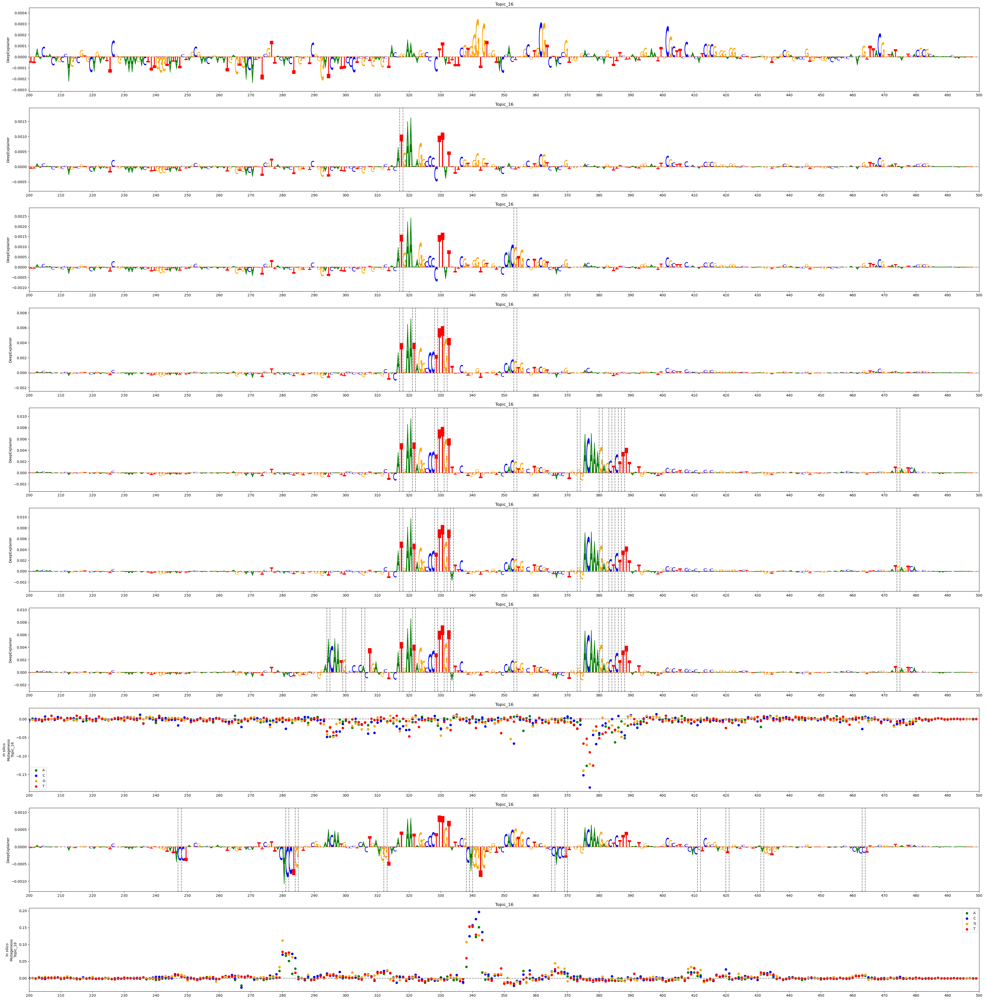

In [18]:
#[15,17,19,22,27,45,49,60,68,72]
id_ = 15
ntrack = 10
fig = plt.figure(figsize=(48,ntrack*5))
st=200
end=500

for trck_, n_mut in enumerate([0,1,2,5,11,12,15]):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
    ax1.set_xlim([st,end])

ax_ = utils.plot_mutagenesis_givenax_fast_withrc(model=model_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=8, seq_onehot=start_x, class_no = 16)
ax_.set_xlim([st,end])

muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
for i, mut_ in enumerate(muts):
    print(i,end=",")
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')


ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=9, seq_onehot=start_x, class_no = 16)
ax2 = utils.plot_mutagenesis_givenax_fast_withrc(model=model_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=10, seq_onehot=start_x, class_no = 16)

muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
for i, mut_ in enumerate(muts):
    ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
    ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
ax1.set_xlim([st,end])
ax2.set_xlim([st,end])

plt.savefig("figures/mutational_steps/MM_steps_EFS-1.pdf",transparent=True)

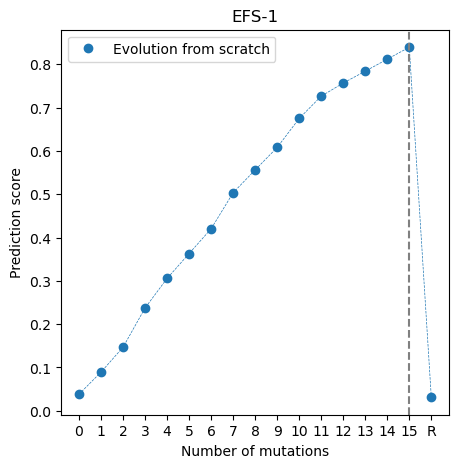

In [19]:
id_ = 15

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15]

plt.figure(figsize=(5,5))
plt.title("EFS-1")
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+[repr_pred],label="Evolution from scratch",linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+[repr_pred],label="Evolution from scratch",linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")

plt.savefig("figures/mutational_steps/MM_steps_EFS-1_prediction.pdf",transparent=True,dpi=300)

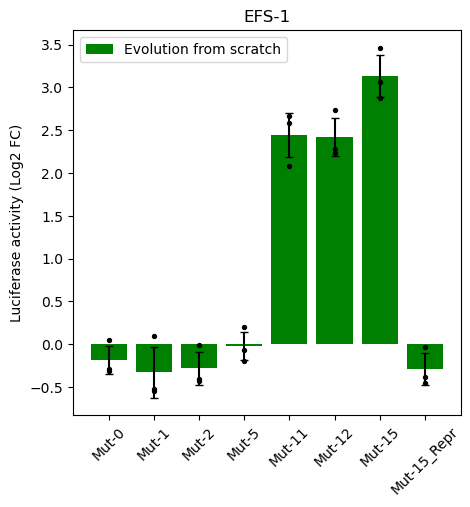

In [20]:
luciferase_dict = {"ids":[],"values":[]}
with open("data/luciferase/EFS1_steps.txt","r") as fr:
    for line in fr:
        if line.startswith("id"):
            continue
        sep = line.strip().split("\t")
        luciferase_dict["ids"].append(sep[0])
        luciferase_dict["values"].append(sep[1:])
luciferase_dict["values"] = np.array(luciferase_dict["values"],dtype="float")

plt.figure(figsize=(5,5))
plt.title("EFS-1")
mean = np.mean(np.log2(luciferase_dict["values"]),axis=1)
std = np.std(np.log2(luciferase_dict["values"]),axis=1)

index = np.argsort(mean)[::-1]
temp = sorted(mean)[::-1]
res = [temp.index(i) for i in mean]

plt.bar(range(len(mean)),mean,color="green",label="Evolution from scratch",yerr=std,capsize=3)
plt.legend()

for i in (range(len(mean))):
    for k in np.log2(luciferase_dict["values"][i]):
        plt.scatter(i,k,color="black",zorder=10,s=8)
    
_ = plt.xticks(range(len(mean)),np.array(luciferase_dict["ids"]),rotation=45)
plt.ylabel("Luciferase activity (Log2 FC)")

plt.savefig("figures/mutational_steps/MM_steps_EFS-1_luciferase.pdf",transparent=True,dpi=300)


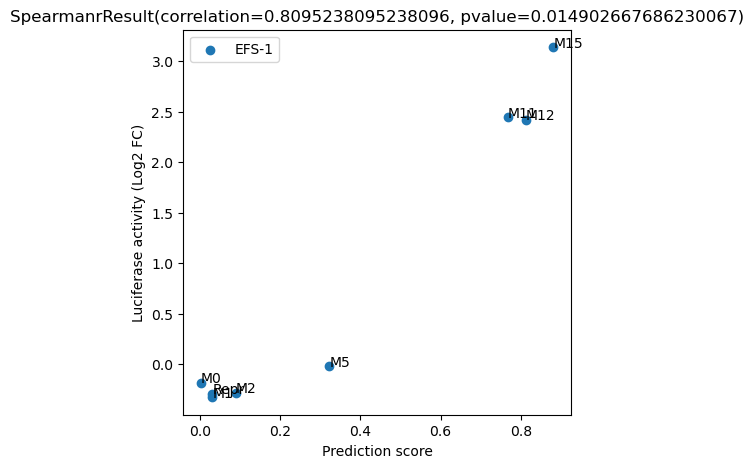

In [21]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot()
plt.title("EFS-1")
mean_luciferase_scores = mean
prediction_scores = list(random_seq_4000_dict["mut_pred"][22,[0,1,2,5,11,12,15],15].T)+[repr_pred]
annotation = ["M0","M1","M2","M5","M11","M12","M15","Repr"]
plt.scatter(prediction_scores,mean_luciferase_scores,label="EFS-1")
for i, txt in enumerate(annotation):
    ax.annotate(txt, (prediction_scores[i], mean_luciferase_scores[i]))
plt.ylabel("Luciferase activity (Log2 FC)")
plt.xlabel("Prediction score")
plt.legend()

ax.set_title(scipy.stats.spearmanr(np.array(prediction_scores),np.array(mean_luciferase_scores),axis=None))

plt.savefig("figures/mutational_steps/MM_steps_EFS-1_correlation.pdf",transparent=True,dpi=300)

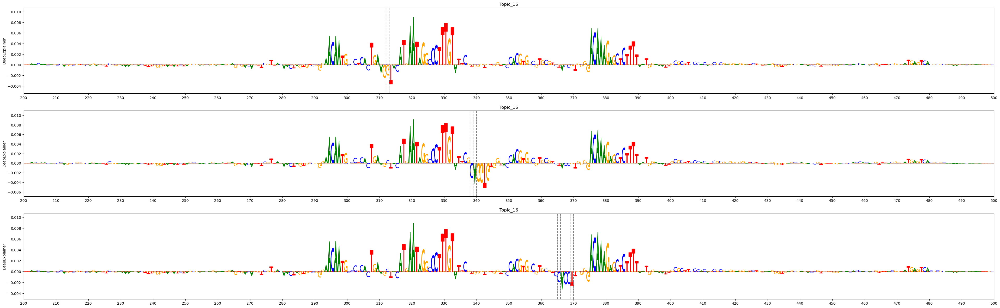

In [22]:
id_ = 15
ntrack = 7
fig = plt.figure(figsize=(48,ntrack*5))

st=200
end=500

muts_all = [["312_G"],["338_C","339_A"],["365_C","369_T"]]
for trck_, muts in enumerate(muts_all):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_ori_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_ori_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_ori_.split("_")[1]], dtype='int8')
    
    for mut_ in muts:
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    ax1.set_xlim([st,end])
    
    for mut_ in muts:
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        
plt.savefig("figures/repressor_addition/MM_singleMut_repressor_EFS-1.pdf",transparent=True)

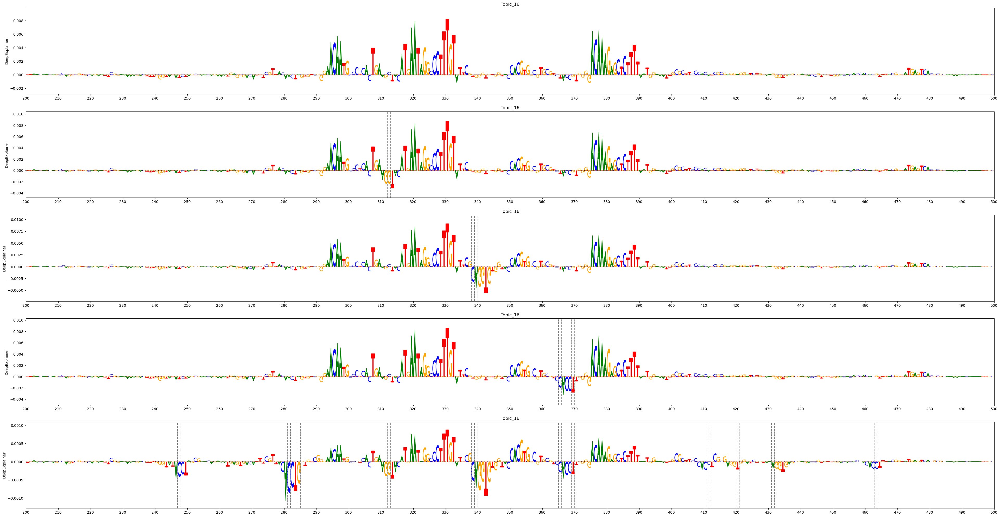

In [6]:
id_ = 15
ntrack = 5
fig = plt.figure(figsize=(48,ntrack*5))

st=200
end=500

muts_all = [[],["312_G"],["338_C","339_A"],["365_C","369_T"],["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]]
for trck_, muts in enumerate(muts_all):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_ori_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_ori_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_ori_.split("_")[1]], dtype='int8')
    
    for mut_ in muts:
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    ax1.set_xlim([st,end])
    
    for mut_ in muts:
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        
plt.savefig("figures/repressor_addition/MM_singleMut_repressor_wt_9repr_EFS-1.pdf",transparent=True)

In [23]:
id_ = 15

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}


start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["312_G"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-1_1repr_312_G')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")


start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["338_C","339_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-1_1repr_338_C_339_A')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")



start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["365_C","369_T"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-1_1repr_365_C_369_T')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")


>MM-EFS-1_1repr_312_G
CTGATTGTTTGAACCATTGTTACGATTTGGTAGCGAGGCCCATTTTTTAGAATTCGGGACCTCTTAGACAGGGTCCAAAGCATTTGAACTGATCGGTCTATCCGGTTATGACCGGTCTTAAACTCCGCTCACGAAAGTCACTGGGTCATAGCTGTATCTAACGTCCCCTGACGTTGTACGTTTCCGATTGTCGGTGAGCTTTAACAACAGCCAGTCGTGCAGAATTCGGAAAAAGACTTTGGGTATATCTAGCGAACAGAAATGAGTGACATTTCGTTACAACTAGTGTCGGGAACAATGCCCTCACTGAAGGTACATGAATAGGCCCTTTGTATTCGTGGGTGTGGTACCACGTGGCGTGCGTCTACCGTGGGGACAAAGAGCTCTTTTAATGGAAATTGCGCTTCCCACATCGCGAGGAGGATCTGTAAGGGTGAGCGAGACCGTGTTGGACACACCACACGTTTACGGTATGAGTCACGCGCAAAAAACAAAATTGC
>MM-EFS-1_1repr_338_C_339_A
CTGATTGTTTGAACCATTGTTACGATTTGGTAGCGAGGCCCATTTTTTAGAATTCGGGACCTCTTAGACAGGGTCCAAAGCATTTGAACTGATCGGTCTATCCGGTTATGACCGGTCTTAAACTCCGCTCACGAAAGTCACTGGGTCATAGCTGTATCTAACGTCCCCTGACGTTGTACGTTTCCGATTGTCGGTGAGCTTTAACAACAGCCAGTCGTGCAGAATTCGGAAAAAGACTTTGGGTATATCTAGCGAACAGAAATGAGTGACATTTCGTTACAACTAGTGTCGGGAACAATGCCCTCACTGAAGCTACATGAATAGGCCCTTTGTATTCGCAGGTGTGGTACCACGTGGCGTGCGTCTACCGTGGGGACAAAGAGCTCTTTTAATGGAAATTGCGCTTCCCACATCGCGAGGAGGATCTGTAAGGGTGAGCGAGACCGTGT

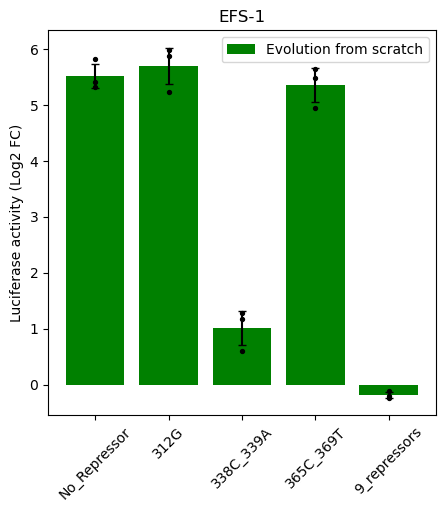

In [10]:
luciferase_dict = {"ids":[],"values":[]}
with open("data/luciferase/EFS1_repressors.txt","r") as fr:
    for line in fr:
        if line.startswith("id"):
            continue
        sep = line.strip().split("\t")
        luciferase_dict["ids"].append(sep[0])
        luciferase_dict["values"].append(sep[1:])
luciferase_dict["values"] = np.array(luciferase_dict["values"],dtype="float")

plt.figure(figsize=(5,5))
plt.title("EFS-1")
mean = np.mean(np.log2(luciferase_dict["values"]),axis=1)
std = np.std(np.log2(luciferase_dict["values"]),axis=1)

index = np.argsort(mean)[::-1]
temp = sorted(mean)[::-1]
res = [temp.index(i) for i in mean]

plt.bar(range(len(mean)),mean,color="green",label="Evolution from scratch",yerr=std,capsize=3)
plt.legend()

for i in (range(len(mean))):
    for k in np.log2(luciferase_dict["values"][i]):
        plt.scatter(i,k,color="black",zorder=10,s=8)
    
_ = plt.xticks(range(len(mean)),np.array(luciferase_dict["ids"]),rotation=45)
plt.ylabel("Luciferase activity (Log2 FC)")

plt.savefig("figures/repressor_addition/MM_EFS-1_repressors_luciferase.pdf",transparent=True,dpi=300)


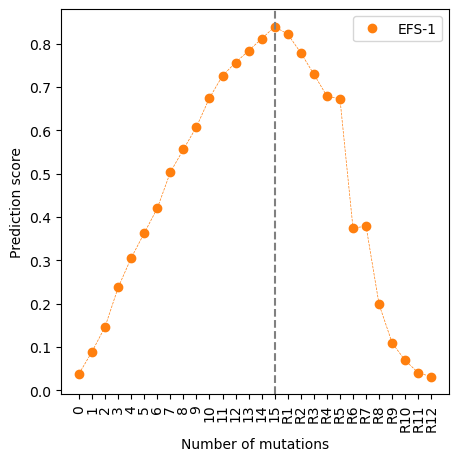

In [25]:
plt.figure(figsize=(5,5))

id_ = 15
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = []
muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    repr_pred.append(model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15])

for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,label="EFS-1",linestyle="",marker="o",color="C1")
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,linestyle="--",linewidth=0.5,color="C1")

_ = plt.xticks(range(28),list(range(16))+["R1","R2","R3","R4","R5","R6","R7","R8","R9","R10","R11","R12"],rotation=90)
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.savefig("figures/repressor_addition/MM_RepressorSteps_EFS-1_prediction.pdf",transparent=True,dpi=300)


In [26]:
#[15,17,19,22,27,45,49,60,68,72]
id_ = 60

for n_mut in [0,2,7,8,9,12,13,14,15]:
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        
    print(f'>MM-EFS-8_mut{n_mut}')
    for nuc in start_x[0]:
        if nuc[0]==1:
            print("A",end="")
        if nuc[1]==1:
            print("C",end="")
        if nuc[2]==1:
            print("G",end="")
        if nuc[3]==1:
            print("T",end="")
    print("")
    


>MM-EFS-8_mut0
ATACGCACGACAAAGCCTCATCGATAGCAAAGGGAGAACGGATGAACTAAGGTGTCATCAGCGCCGTGGCAATCCCGCGAAAAACAACACAATATTTTAGGAACAAAACTATTGCGCCCTCAAGGTTCAAGTCGCATTTTGCTGATGGATAATATCCTACTTACTGGCAGCGAACACCGTACGAGGGTGGCTAGACTACTCAGGGTCTATAGAACTTGAGTGGGACATTGGGTATTCAGCATTCATGCAAGAATTGTACAGAGACATAGACACGCGCAAAGGTTGCCTGACCGCTCCATTAAGCGGCTGTTTCGGCGACTGGGGTAATATCCATTTTTCTGGGAGCGTACTTCTATGAGTCGGATCTGTGGATTCTTTTCACACTCCTAAATCGAACGGGGTGACGTTCACATGGGTCATTCACTGTGCCTTTCCCGTGGAAGGTGACTTGGGAGGCTGCTTGGAGTTTGGGATCGTATTGCGGGATGCCTTGTACAGTG
>MM-EFS-8_mut2
ATACGCACGACAAAGCCTCATCGATAGCAAAGGGAGAACGGATGAACTAAGGTGTCATCAGCGCCGTGGCAATCCCGCGAAAAACAACACAATATTTTAGGAACAAAACTATTGCGCCCTCAAGGTTCAAGTCGCATTTTGCTGATGGATAATATCCTACTTACTGGCAGCGAACACCGTACGAGGGTGGCTAGACTACTCAGGGTCTATAGAACTTGAGTGGGACATTGGGTATTCAGCATTCATGCAAGAATTGTACAGAGACATAGACACGCGCAAAGGTCGCGTGACCGCTCCATTAAGCGGCTGTTTCGGCGACTGGGGTAATATCCATTTTTCTGGGAGCGTACTTCTATGAGTCGGATCTGTGGATTCTTTTCACACTCCTAAATCGAACGGGGTGACGTTCACATGGGTCATTCACTGTGCCTTTCCCGTGGAAGGTGACTTGGGAGGCTGCTTGGAGTTT

In [27]:
id_ = 60
nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-8_repr')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")

>MM-EFS-8_repr
ATACGCACGACAAAGCCTCATCGATAGCAAAGGGAGAACGGATGAACTAAGGTGTCATCAGCGCCGTGGCAATCCCGCGAAAAACAACACAATATTTTAGGAACAAAACTATTGCGCCCTCAAGGTTCAAGTCGCATTTTGCTGATGGATAATATCCTACCTACTGGCAGCGAACACCTTACGCAGGTGGCTAGACTACTCAGGTGCTATAGAACATGAATGGGGCATTGTGTATTCAGCATGAATGGAAGCATTGTTCAGAGACATAGACACGCGCATAGGTCGTGTGACCGCTCCATTAAGCGGCTGTTTCGGCGACTGGGGTAATATCCATTTTTCTGGGAGCGTACCTGTATGAATCGGATCTGTGGTTTCTTTTCACACACCTAAATCGAACGGGGTGACGTTCACATGGGTCATTCACTGTGCCTTTCCCGTGGAAGGTGACTTGGGAGGCTGCTTGGAGTTTGGGATCGTATTGCGGGATGCCTTGTACAGTG


0,1,2,3,4,5,6,7,8,

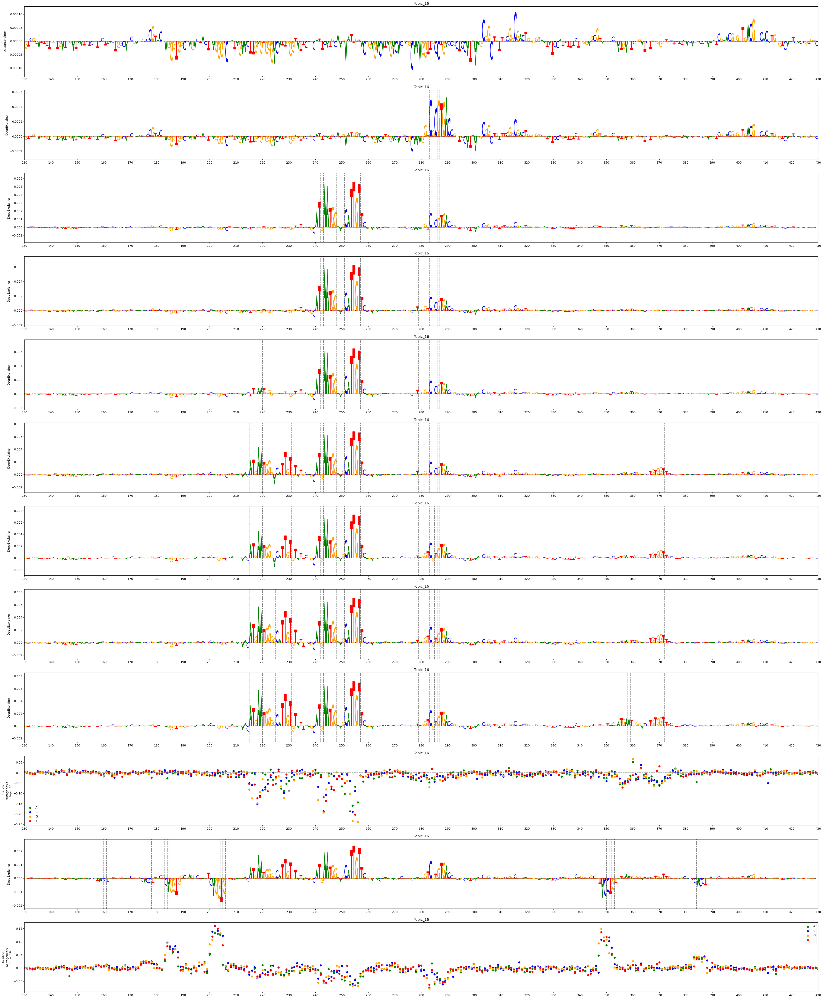

In [39]:
#[15,17,19,22,27,45,49,60,68,72]
id_ = 60
ntrack = 12
fig = plt.figure(figsize=(48,ntrack*5))

st=130
end=430

for trck_, n_mut in enumerate([0,2,7,8,9,12,13,14,15]):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
        
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)
    
    for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:n_mut]):
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
    ax1.set_xlim([st,end])

ax_ = utils.plot_mutagenesis_givenax_fast_withrc(model=model_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=10, seq_onehot=start_x, class_no = 16)
ax_.set_xlim([st,end])

muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
for i, mut_ in enumerate(muts):
    print(i,end=",")
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')


ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=11, seq_onehot=start_x, class_no = 16)
ax2 = utils.plot_mutagenesis_givenax_fast_withrc(model=model_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=12, seq_onehot=start_x, class_no = 16)

muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
for i, mut_ in enumerate(muts):
    ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
    ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
ax1.set_xlim([st,end])
ax2.set_xlim([st,end])

plt.savefig("figures/mutational_steps/MM_steps_EFS-8.pdf",transparent=True)


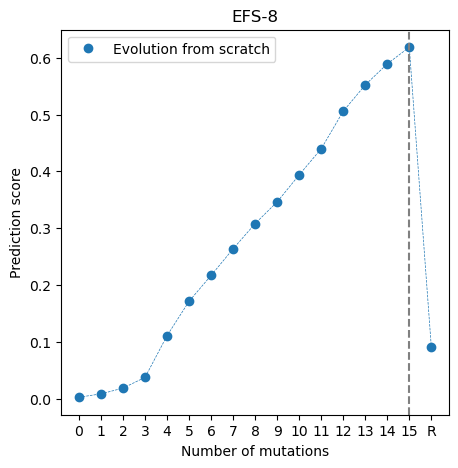

In [29]:
id_ = 60

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15]

plt.figure(figsize=(5,5))
plt.title("EFS-8")
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+[repr_pred],label="Evolution from scratch",linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+[repr_pred],label="Evolution from scratch",linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")

plt.savefig("figures/mutational_steps/MM_steps_EFS-8_prediction.pdf",transparent=True,dpi=300)


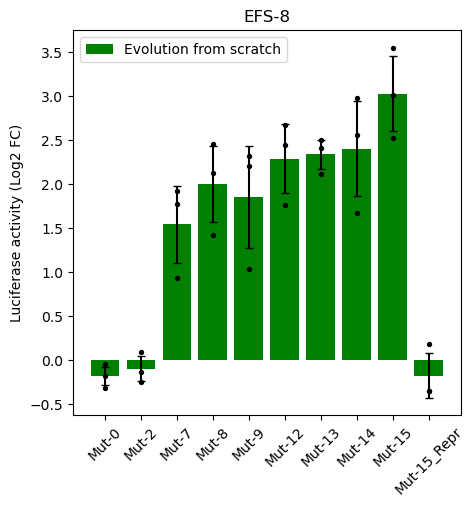

In [30]:
luciferase_dict = {"ids":[],"values":[]}
with open("data/luciferase/EFS8_steps.txt","r") as fr:
    for line in fr:
        if line.startswith("id"):
            continue
        sep = line.strip().split("\t")
        luciferase_dict["ids"].append(sep[0])
        luciferase_dict["values"].append(sep[1:])
luciferase_dict["values"] = np.array(luciferase_dict["values"],dtype="float")

plt.figure(figsize=(5,5))
plt.title("EFS-8")
mean = np.mean(np.log2(luciferase_dict["values"]),axis=1)
std = np.std(np.log2(luciferase_dict["values"]),axis=1)

index = np.argsort(mean)[::-1]
temp = sorted(mean)[::-1]
res = [temp.index(i) for i in mean]

plt.bar(range(len(mean)),mean,color="green",label="Evolution from scratch",yerr=std,capsize=3)
plt.legend()

for i in (range(len(mean))):
    for k in np.log2(luciferase_dict["values"][i]):
        plt.scatter(i,k,color="black",zorder=10,s=8)
    
_ = plt.xticks(range(len(mean)),np.array(luciferase_dict["ids"]),rotation=45)
plt.ylabel("Luciferase activity (Log2 FC)")

plt.savefig("figures/mutational_steps/MM_steps_EFS-8_luciferase.pdf",transparent=True,dpi=300)


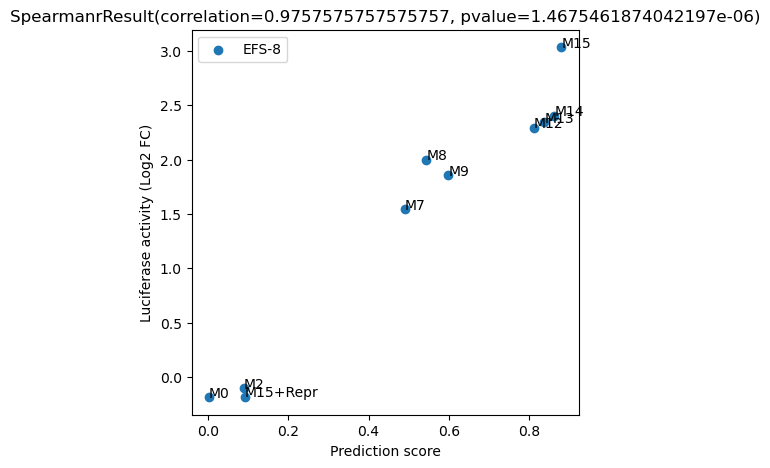

In [31]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot()
plt.title("EFS-8")
mean_luciferase_scores = mean
prediction_scores = list(random_seq_4000_dict["mut_pred"][22,[0,2,7,8,9,12,13,14,15],15].T)+[repr_pred]
annotation = ["M0","M2","M7","M8","M9","M12","M13","M14","M15","M15+Repr"]
plt.scatter(prediction_scores,mean_luciferase_scores,label="EFS-8")
for i, txt in enumerate(annotation):
    ax.annotate(txt, (prediction_scores[i], mean_luciferase_scores[i]))
plt.ylabel("Luciferase activity (Log2 FC)")
plt.xlabel("Prediction score")
plt.legend()

ax.set_title(scipy.stats.spearmanr(np.array(prediction_scores),np.array(mean_luciferase_scores),axis=None))

plt.savefig("figures/mutational_steps/MM_steps_EFS-8_correlation.pdf",transparent=True,dpi=300)


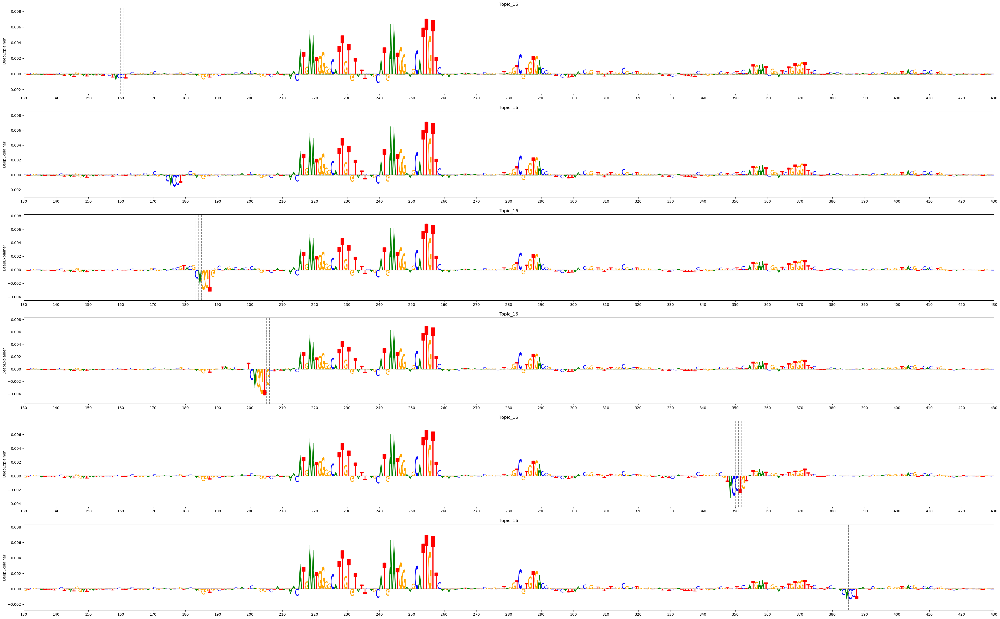

In [32]:
id_ = 60
ntrack = 6
fig = plt.figure(figsize=(48,ntrack*5))

st=130
end=430

muts_all = [["160_C"],["178_T"],["183_C","184_A"],["204_T","205_G"],["350_C","352_G"],["384_A"]]
for trck_, muts in enumerate(muts_all):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_ori_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_ori_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_ori_.split("_")[1]], dtype='int8')
    
    for mut_ in muts:
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)

    for mut_ in muts:
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
        ax1.set_xlim([st,end])
    
plt.savefig("figures/repressor_addition/MM_singleMut_repressor_EFS-8.pdf",transparent=True)


In [33]:
id_ = 60

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["184_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-8_1repr_184_A')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")


start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["184_A","204_T"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-8_2repr_184_A_204_T')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")



start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
for i, mut_or_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_or_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_or_.split("_")[1]], dtype='int8')

muts = ["184_A","204_T","350_C"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

print(f'>MM-EFS-8_3repr_184_A_204_T_350_C')
for nuc in start_x[0]:
    if nuc[0]==1:
        print("A",end="")
    if nuc[1]==1:
        print("C",end="")
    if nuc[2]==1:
        print("G",end="")
    if nuc[3]==1:
        print("T",end="")
print("")


>MM-EFS-8_1repr_184_A
ATACGCACGACAAAGCCTCATCGATAGCAAAGGGAGAACGGATGAACTAAGGTGTCATCAGCGCCGTGGCAATCCCGCGAAAAACAACACAATATTTTAGGAACAAAACTATTGCGCCCTCAAGGTTCAAGTCGCATTTTGCTGATGGATAATATCCTACTTACTGGCAGCGAACACCGTACGAAGGTGGCTAGACTACTCAGGGTCTATAGAACATGAATGGGGCATTGTGTATTCAGCATGAATGGAAGCATTGTTCAGAGACATAGACACGCGCATAGGTCGTGTGACCGCTCCATTAAGCGGCTGTTTCGGCGACTGGGGTAATATCCATTTTTCTGGGAGCGTACTTCTATGAATCGGATCTGTGGTTTCTTTTCACACTCCTAAATCGAACGGGGTGACGTTCACATGGGTCATTCACTGTGCCTTTCCCGTGGAAGGTGACTTGGGAGGCTGCTTGGAGTTTGGGATCGTATTGCGGGATGCCTTGTACAGTG
>MM-EFS-8_2repr_184_A_204_T
ATACGCACGACAAAGCCTCATCGATAGCAAAGGGAGAACGGATGAACTAAGGTGTCATCAGCGCCGTGGCAATCCCGCGAAAAACAACACAATATTTTAGGAACAAAACTATTGCGCCCTCAAGGTTCAAGTCGCATTTTGCTGATGGATAATATCCTACTTACTGGCAGCGAACACCGTACGAAGGTGGCTAGACTACTCAGGTTCTATAGAACATGAATGGGGCATTGTGTATTCAGCATGAATGGAAGCATTGTTCAGAGACATAGACACGCGCATAGGTCGTGTGACCGCTCCATTAAGCGGCTGTTTCGGCGACTGGGGTAATATCCATTTTTCTGGGAGCGTACTTCTATGAATCGGATCTGTGGTTTCTTTTCACACTCCTAAATCGAACGGGGTGACGTTCACATGGGTCATTCACTGTGCCTTTCCCGTGGAAGGTGACT

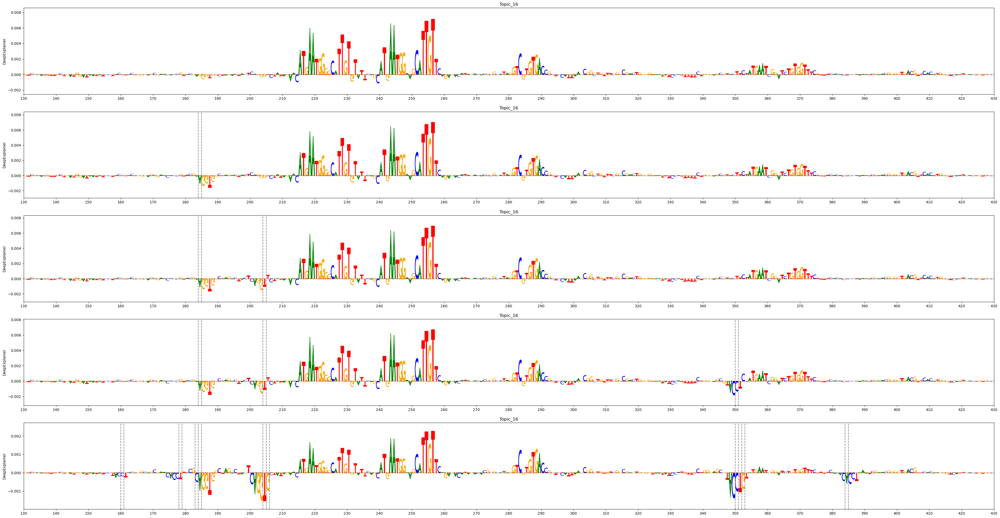

In [13]:
id_ = 60
ntrack = 5
fig = plt.figure(figsize=(48,ntrack*5))

st=130
end=430

muts_all = [[],["184_A"],["184_A","204_T"],["184_A","204_T","350_C"],["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]]
for trck_, muts in enumerate(muts_all):
    start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])
    for i, mut_ori_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
        start_x[0][int(mut_ori_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_ori_.split("_")[1]], dtype='int8')
    
    for mut_ in muts:
        start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    ax1 = utils.plot_deepexplainer_givenax_withrc(explainer=exp_dict["deepmel2"], fig=fig, ntrack=ntrack, track_no=trck_+1, seq_onehot=start_x, class_no = 16)

    for mut_ in muts:
        ax1.axvline(x=int(mut_.split("_")[0]),linestyle="--",color="gray")
        ax1.axvline(x=int(mut_.split("_")[0])+1,linestyle="--",color="gray")
    ax1.set_xlim([st,end])
    
plt.savefig("figures/repressor_addition/MM_singleMut_wt_6repr_repressor_EFS-8.pdf",transparent=True)


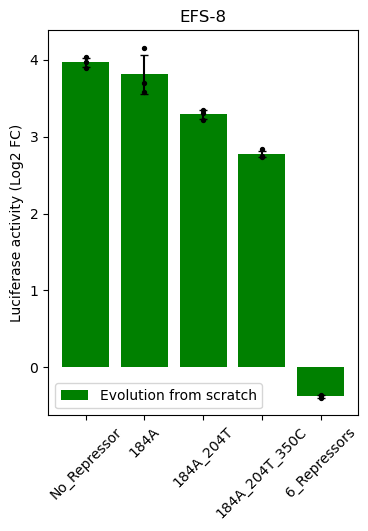

In [34]:
luciferase_dict = {"ids":[],"values":[]}
with open("data/luciferase/EFS8_repressors.txt","r") as fr:
    for line in fr:
        if line.startswith("id"):
            continue
        sep = line.strip().split("\t")
        luciferase_dict["ids"].append(sep[0])
        luciferase_dict["values"].append(sep[1:])
luciferase_dict["values"] = np.array(luciferase_dict["values"],dtype="float")

plt.figure(figsize=(4,5))
plt.title("EFS-8")
mean = np.mean(np.log2(luciferase_dict["values"]),axis=1)
std = np.std(np.log2(luciferase_dict["values"]),axis=1)

index = np.argsort(mean)[::-1]
temp = sorted(mean)[::-1]
res = [temp.index(i) for i in mean]

plt.bar(range(len(mean)),mean,color="green",label="Evolution from scratch",yerr=std,capsize=3)
plt.legend()

for i in (range(len(mean))):
    for k in np.log2(luciferase_dict["values"][i]):
        plt.scatter(i,k,color="black",zorder=10,s=8)
    
_ = plt.xticks(range(len(mean)),np.array(luciferase_dict["ids"]),rotation=45)
plt.ylabel("Luciferase activity (Log2 FC)")

plt.savefig("figures/repressor_addition/MM_EFS-8_repressors_luciferase.pdf",transparent=True,dpi=300)


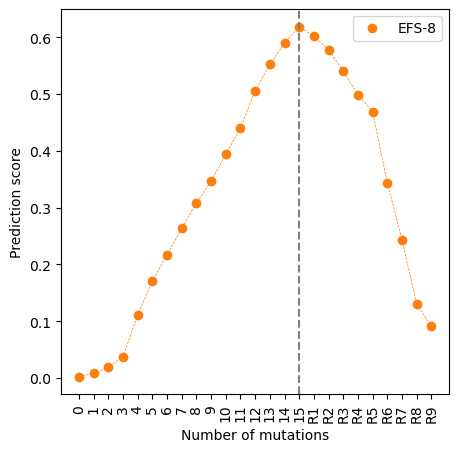

In [38]:
plt.figure(figsize=(5,5))

id_ = 60
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = []
muts = ["160_C","178_T","184_A","183_C","204_T","205_G","350_C","352_G","384_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    repr_pred.append(model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15])

for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,label="EFS-8",linestyle="",marker="o",color="C1")
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,linestyle="--",linewidth=0.5,color="C1")

_ = plt.xticks(range(25),list(range(16))+["R1","R2","R3","R4","R5","R6","R7","R8","R9"],rotation=90)
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.savefig("figures/repressor_addition/MM_RepressorSteps_EFS-8_prediction.pdf",transparent=True)


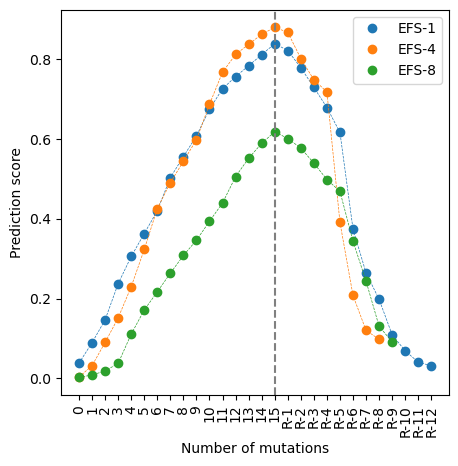

In [37]:
plt.figure(figsize=(5,5))

id_ = 15
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = []
muts = ["247_C","281_C","284_G","312_G","339_A","338_C","369_T","365_C","420_T","411_C","431_A","463_C"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    repr_pred.append(model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15])

for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,label="EFS-1",linestyle="",marker="o",color="C0")
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,linestyle="--",linewidth=0.5,color="C0")


id_ = 22
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = []
muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    repr_pred.append(model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15])

for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,label="EFS-4",linestyle="",marker="o",color="C1")
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,linestyle="--",linewidth=0.5,color="C1")


id_ = 60
start_x = np.copy(random_seq_4000_dict["X"][id_:id_+1])

for i, mut_ in enumerate(random_seq_4000_dict["mut_loc"][id_][:15]):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')

repr_pred = []
muts = ["160_C","178_T","184_A","183_C","204_T","205_G","350_C","352_G","384_A"]
for i, mut_ in enumerate(muts):
    start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
    repr_pred.append(model_dict["deepmel2"].predict([start_x,start_x[:,::-1,::-1]])[0,15])

for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,label="EFS-8",linestyle="",marker="o",color="C2")
plt.legend()
for k,i in enumerate([id_]):
    _ = plt.plot(list(random_seq_4000_dict["mut_pred"][i,:16,15].T)+repr_pred,linestyle="--",linewidth=0.5,color="C2")


_ = plt.xticks(range(28),list(range(16))+["R-1","R-2","R-3","R-4","R-5","R-6","R-7","R-8","R-9","R-10","R-11","R-12"],rotation=90)
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.savefig("figures/repressor_addition/MM_RepressorSteps_EFS-1-4-8_prediction.pdf",transparent=True)

